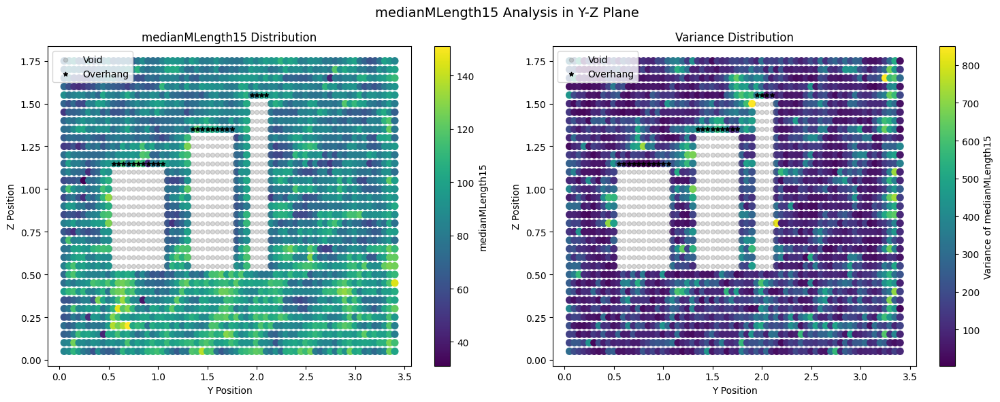

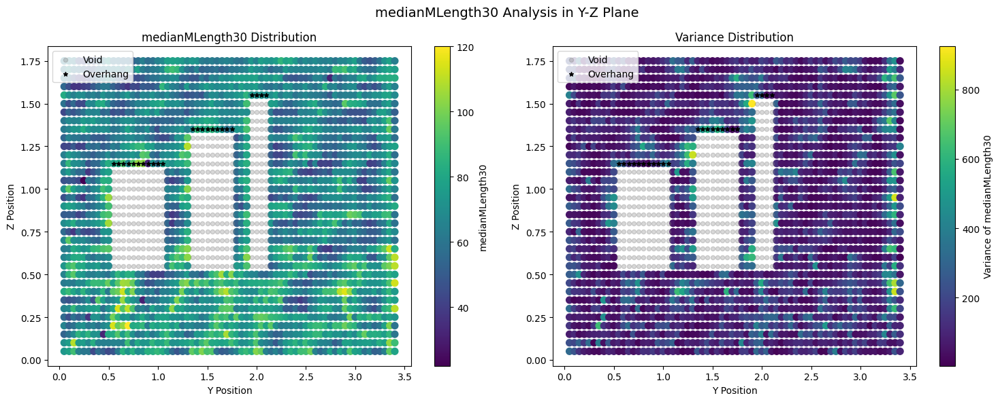

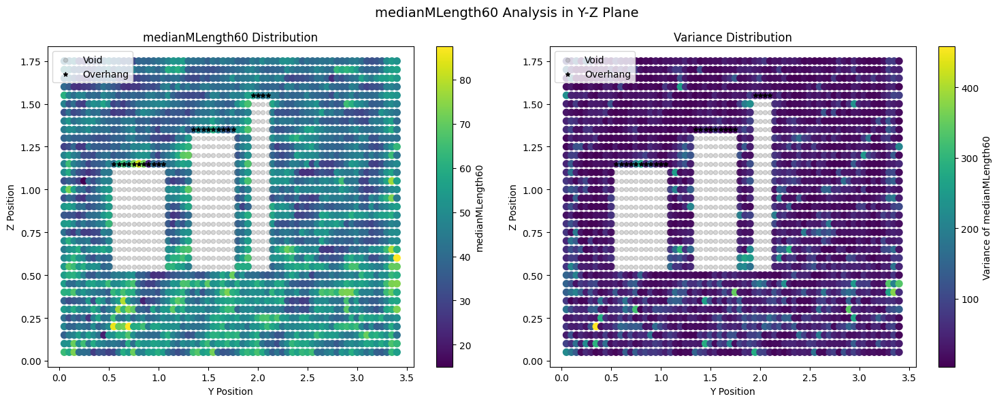

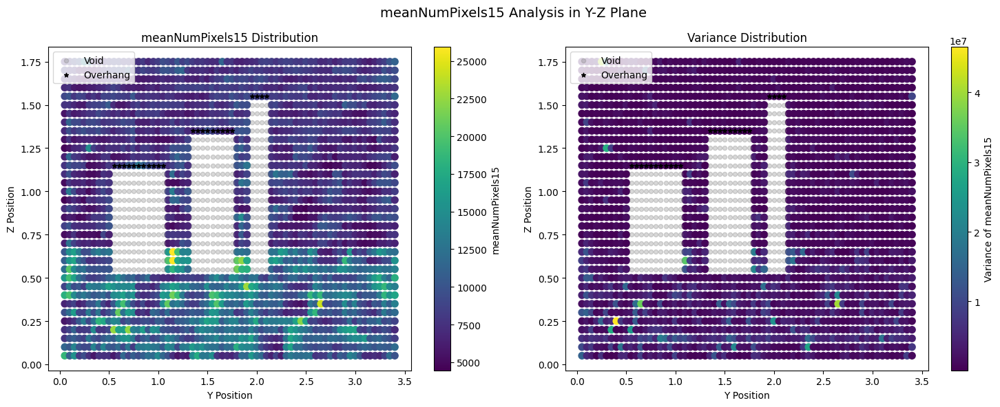

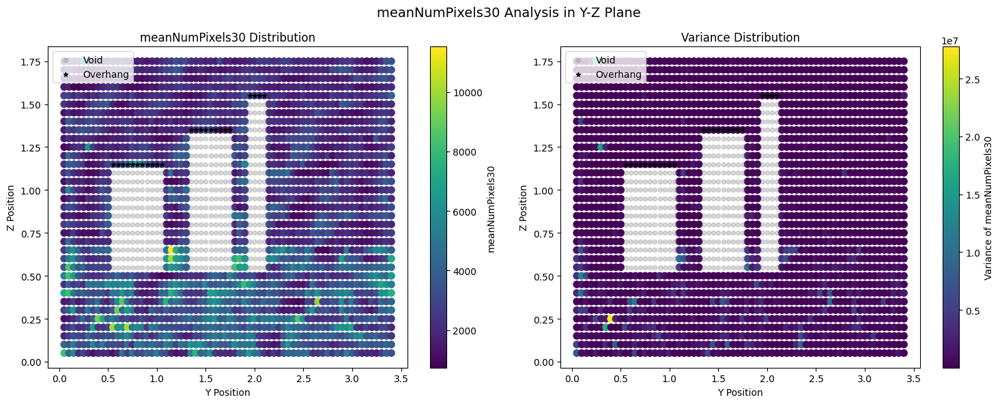

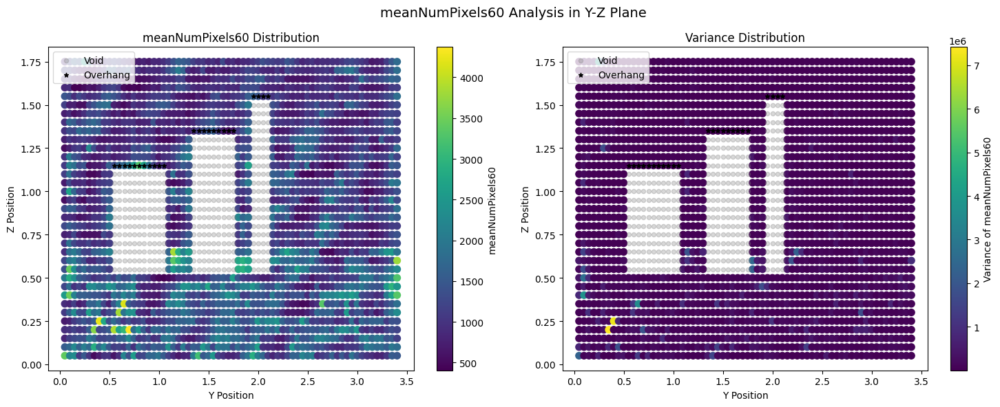

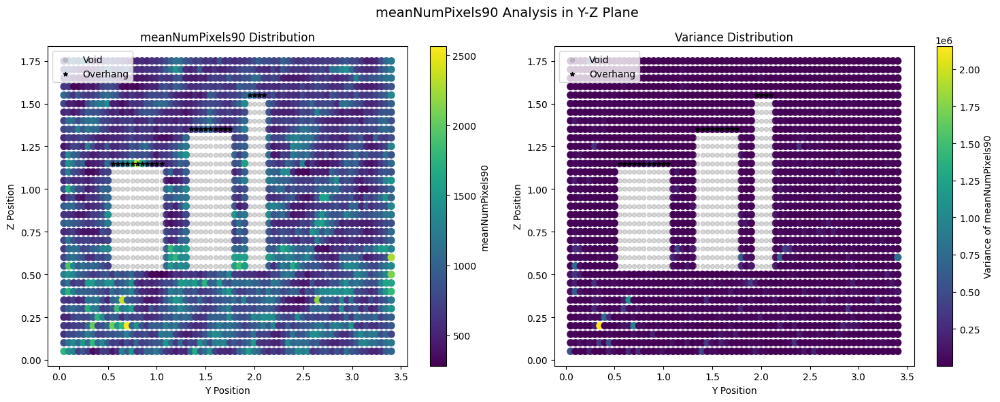

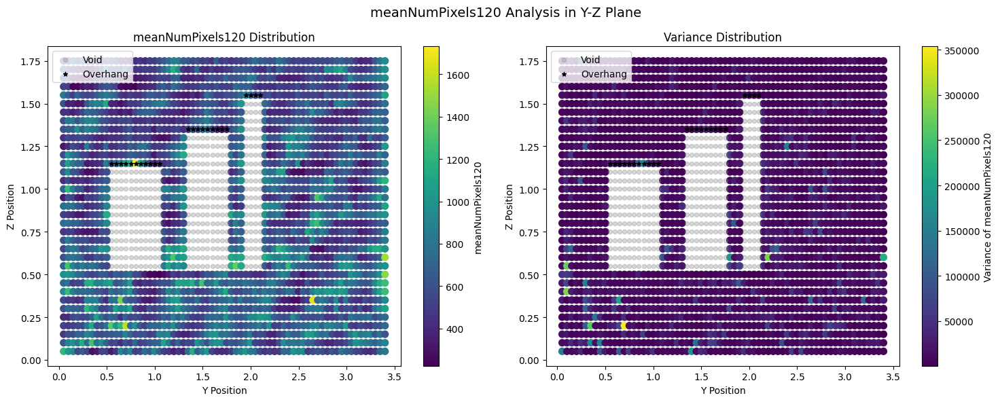

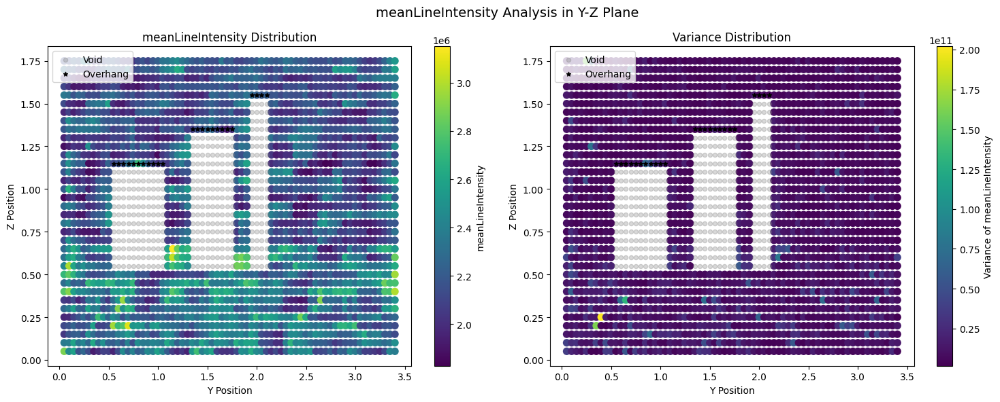

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

%matplotlib inline

# Read the data
# data = pd.read_csv('feedforward.csv')
# data = pd.read_csv('constant.csv')
data = pd.read_csv('./RawData/uniform_Power_every_5_lines.csv')


# Define metrics to analyze
metrics = {
    'medianMLength15': 'varMLength15',
    'medianMLength30': 'varMLength30',
    'medianMLength60': 'varMLength60',
    'meanNumPixels15': 'varNumPixels15',
    'meanNumPixels30': 'varNumPixels30',
    'meanNumPixels60': 'varNumPixels60',
    'meanNumPixels90': 'varNumPixels90',
    'meanNumPixels120': 'varNumPixels120',
    'meanLineIntensity': 'varLineIntensity'
}

# Create Y-Z plane scatter plots
for metric, var_metric in metrics.items():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(f'{metric} Analysis in Y-Z Plane', fontsize=14)
    
    # Mean/Median plot
    scatter1 = ax1.scatter(data['Y_Start'], data['Z'], c=data[metric], 
                          cmap='viridis', s=50)
    
    # Create points for void regions with correct step size and ranges
    # Cavity 1: 0.55 to 1.05, step 0.05
    y_void1 = np.arange(0.55, 1.1, 0.05)
    z_void1 = np.arange(0.55, 1.15, 0.05)
    Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
    void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))
    
    # Cavity 2: 1.35 to 1.75, step 0.05
    y_void2 = np.arange(1.35, 1.8, 0.05)
    z_void2 = np.arange(0.55, 1.35, 0.05)
    Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
    void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))
    
    # Cavity 3: 1.95 to 2.10, step 0.05
    y_void3 = np.arange(1.95, 2.15, 0.05)
    z_void3 = np.arange(0.55, 1.55, 0.05)
    Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
    void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))
    
    # Combine all void points
    void_points = np.vstack((void_points1, void_points2, void_points3))
    
    # Add markers for Wall, Overhang, and Voids
    wall_mask = data['Wall'] > 0
    overhang_mask = data['Overhang'] > 0
    
    ax1.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')
#     ax1.scatter(data[wall_mask]['Y_Start'], data[wall_mask]['Z'], 
#                marker='+', s=20, c='red', label='Wall')
    ax1.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
               marker='*', s=20, c='black', label='Overhang')
    
    plt.colorbar(scatter1, ax=ax1, label=metric)
    ax1.set_xlabel('Y Position')
    ax1.set_ylabel('Z Position')
    ax1.set_title(f'{metric} Distribution')
    ax1.legend(loc='upper left')
    
    # Variance plot
    scatter2 = ax2.scatter(data['Y_Start'], data['Z'], c=data[var_metric], 
                          cmap='viridis', s=50)
    
    # Add same markers to variance plot
    ax2.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')
#     ax2.scatter(data[wall_mask]['Y_Start'], data[wall_mask]['Z'], 
#                 marker='+', s=20, c='red', label='Wall')
    ax2.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
                marker='*', s=20, c='black', label='Overhang')
    
    plt.colorbar(scatter2, ax=ax2, label=f'Variance of {metric}')
    ax2.set_xlabel('Y Position')
    ax2.set_ylabel('Z Position')
    ax2.set_title(f'Variance Distribution')
    ax2.legend(loc='upper left')
    
    plt.tight_layout()
    plt.show()

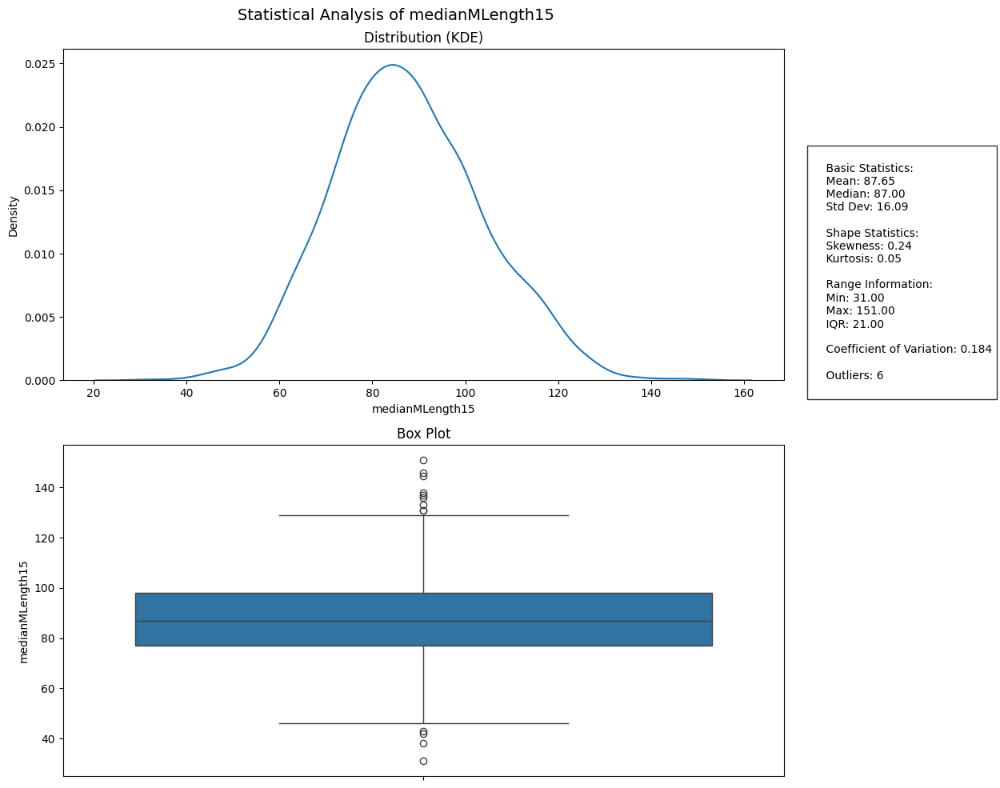

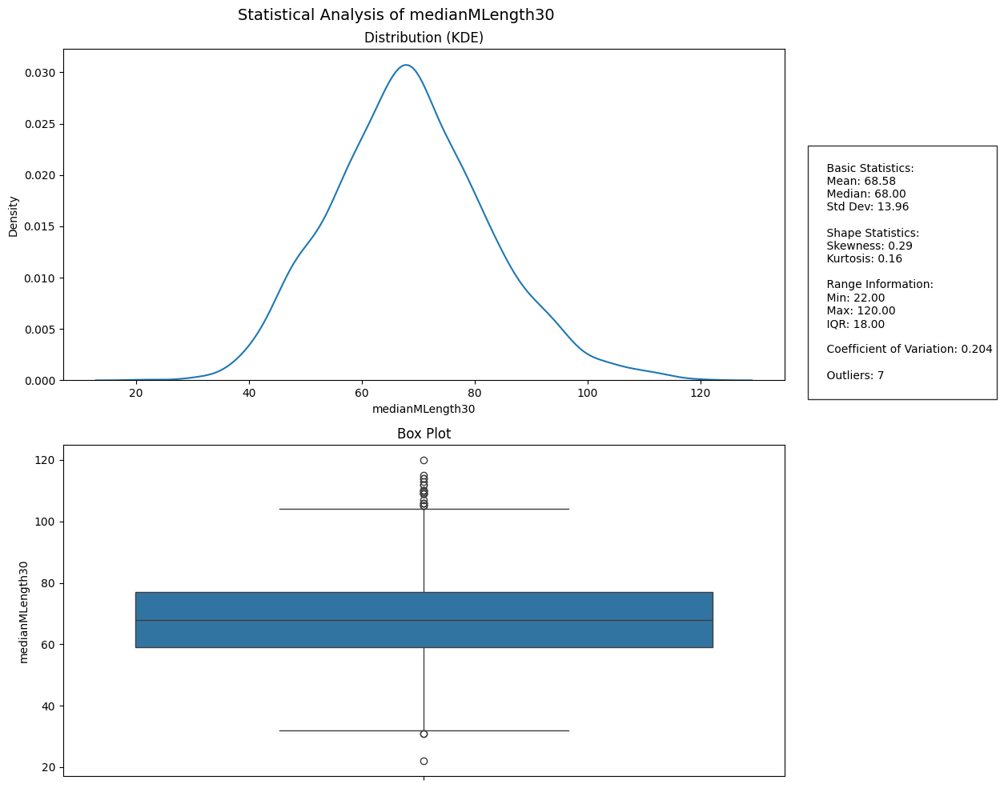

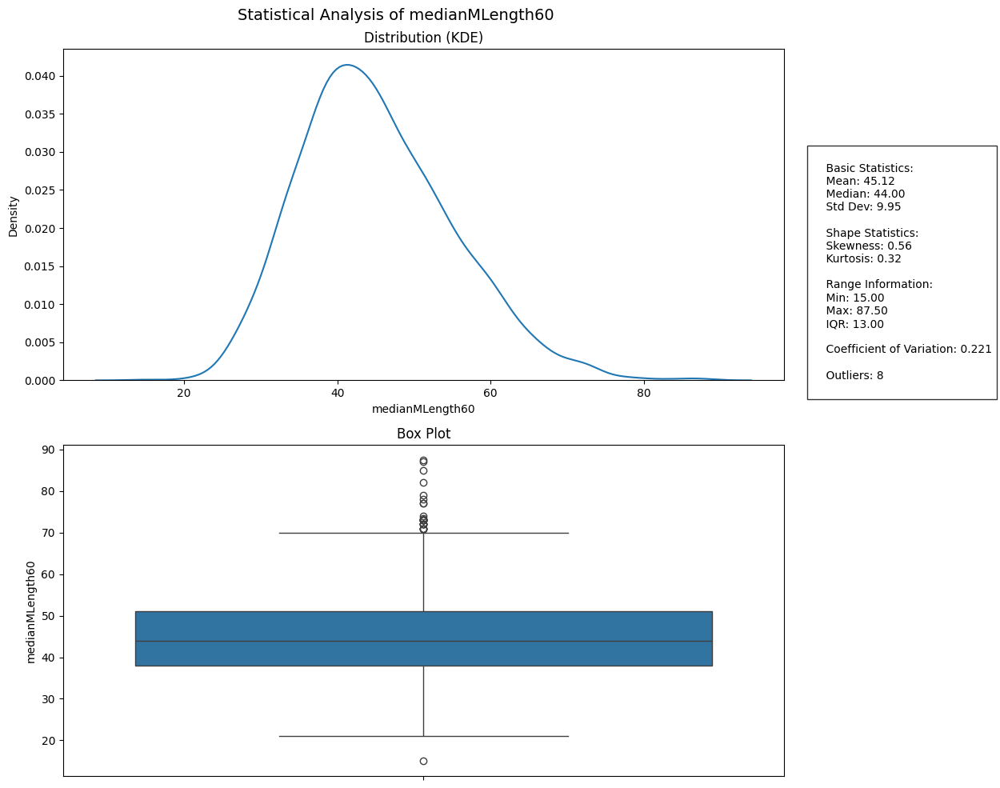

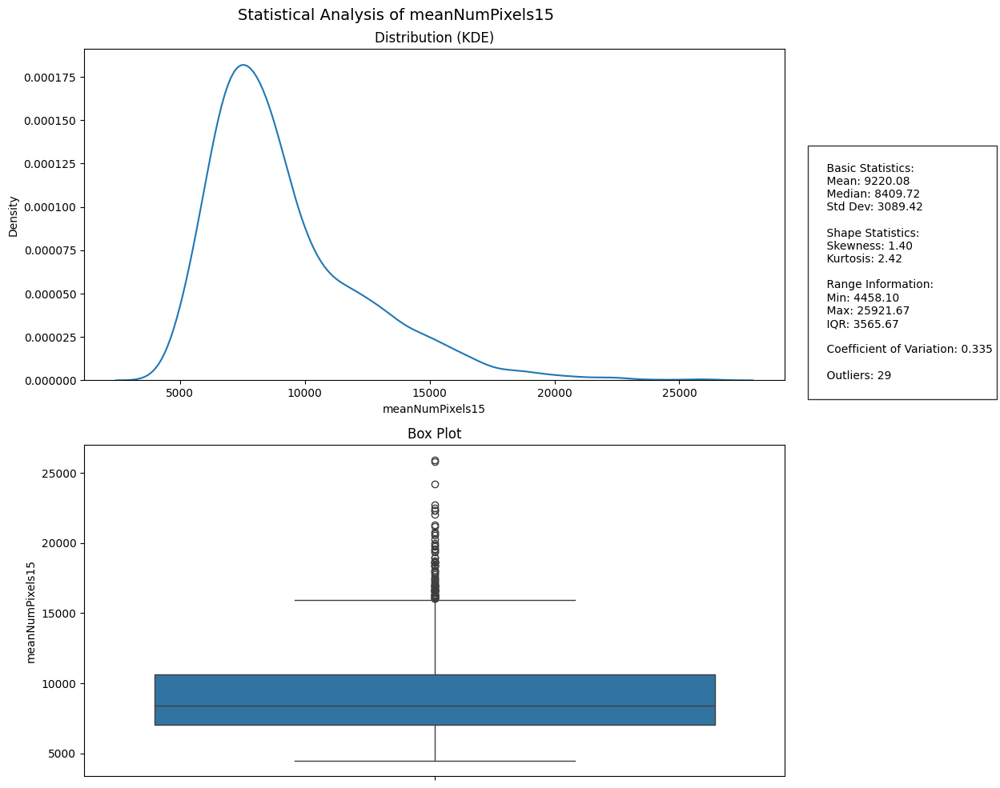

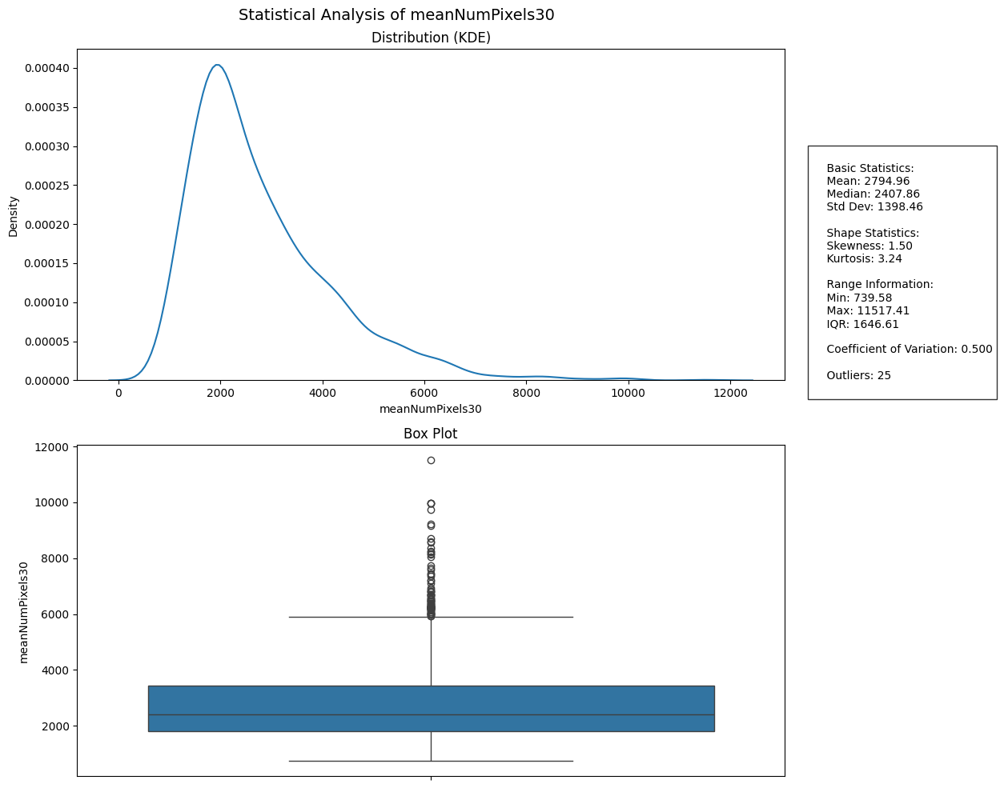

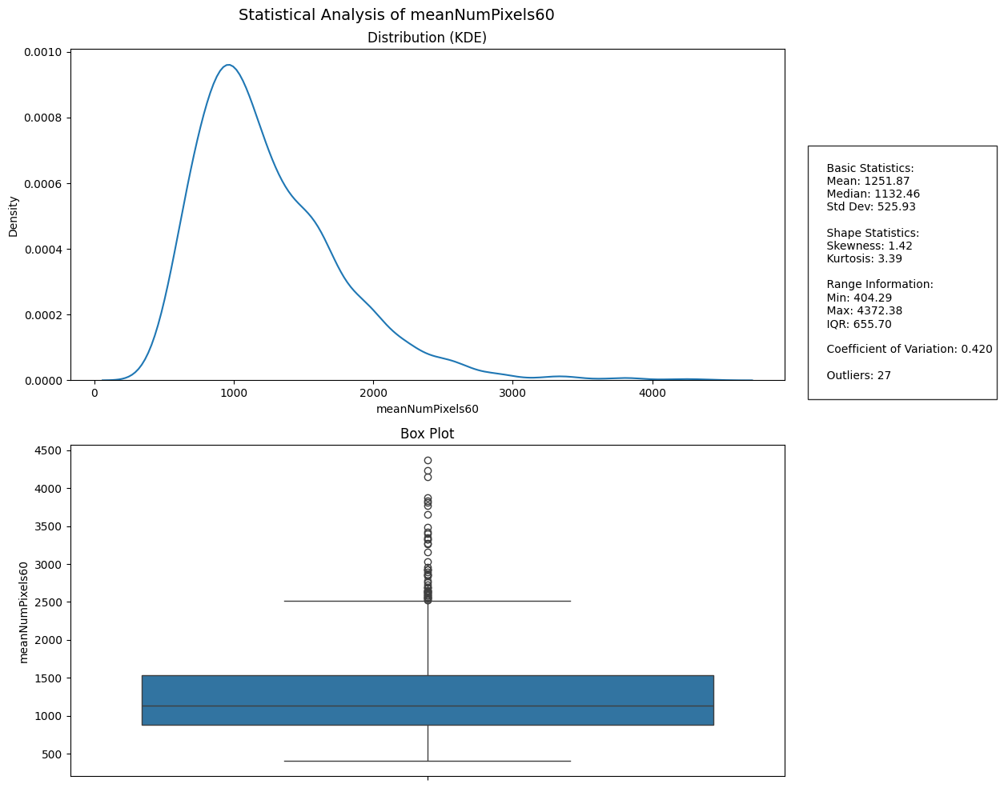

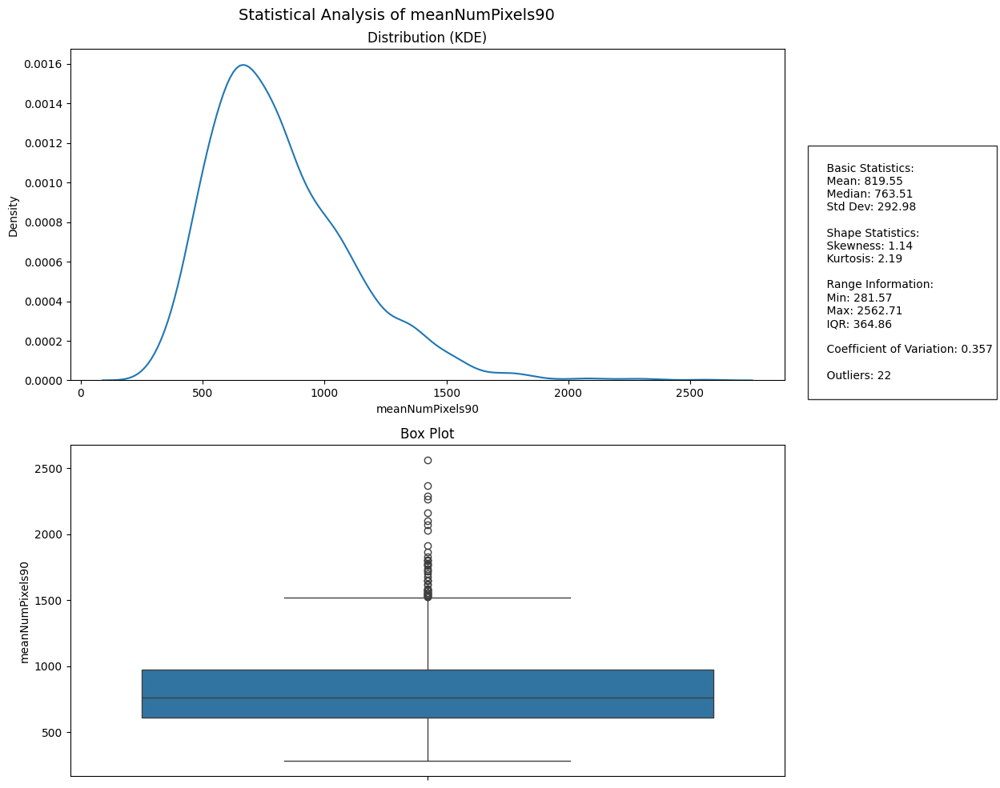

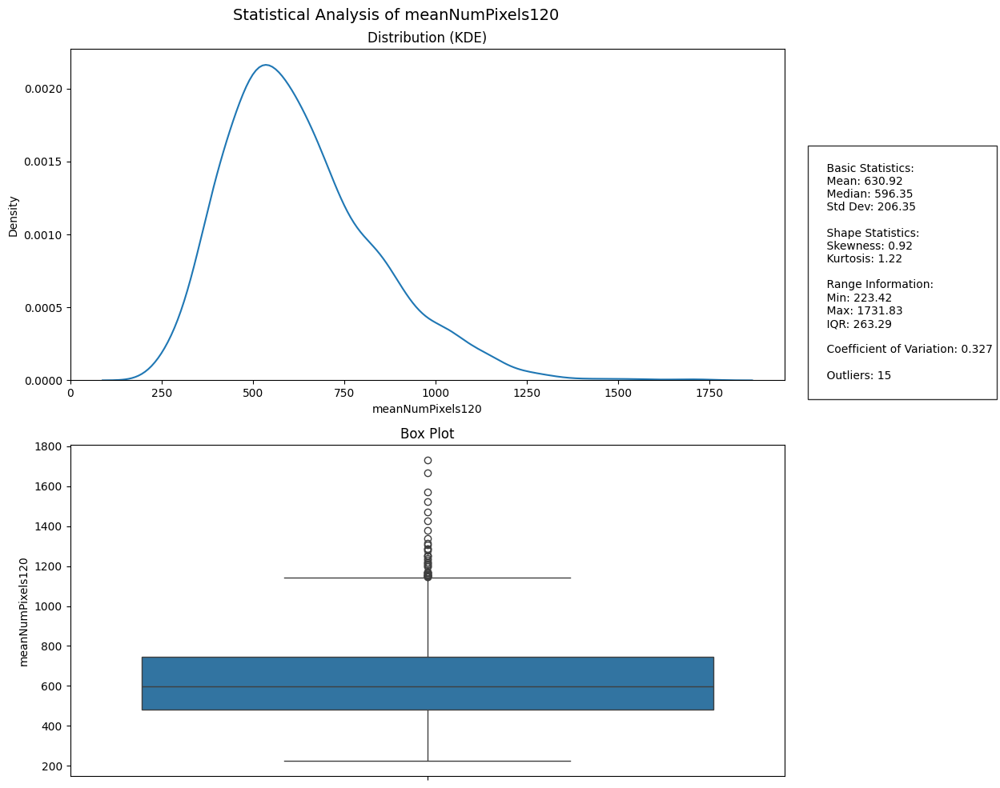

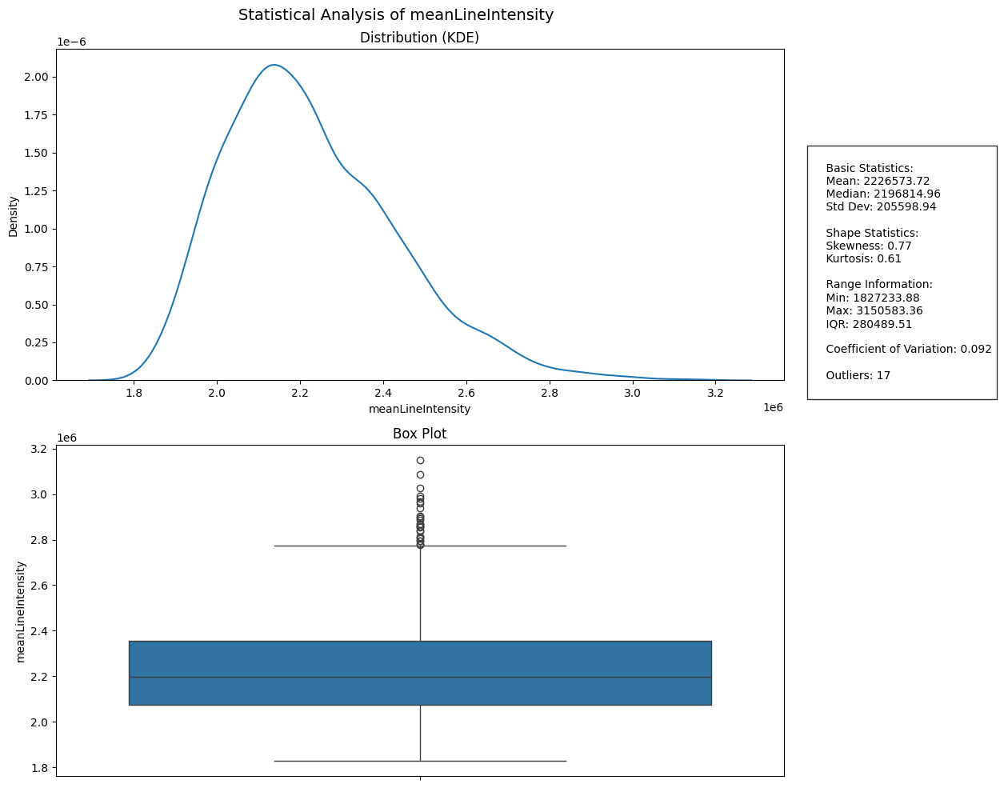

In [2]:
# Create statistical analysis plots
for metric, var_metric in metrics.items():
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))
    fig.suptitle(f'Statistical Analysis of {metric}', fontsize=14)
    
    # KDE plot
    sns.kdeplot(data=data, x=metric, ax=ax1)
    ax1.set_title('Distribution (KDE)')
    ax1.set_xlabel(metric)
    ax1.set_ylabel('Density')
    
    # Box plot
    sns.boxplot(y=data[metric], ax=ax2)
    ax2.set_title('Box Plot')
    ax2.set_ylabel(metric)
    
    # Calculate statistics
    stats_text = f"""
    Basic Statistics:
    Mean: {data[metric].mean():.2f}
    Median: {data[metric].median():.2f}
    Std Dev: {data[metric].std():.2f}
    
    Shape Statistics:
    Skewness: {data[metric].skew():.2f}
    Kurtosis: {data[metric].kurtosis():.2f}
    
    Range Information:
    Min: {data[metric].min():.2f}
    Max: {data[metric].max():.2f}
    IQR: {data[metric].quantile(0.75) - data[metric].quantile(0.25):.2f}
    
    Coefficient of Variation: {(data[metric].std() / data[metric].mean()):.3f}
    
    Outliers: {len(data[data[metric] > data[metric].mean() + 3*data[metric].std()])}
    """
    
    # Add text box with statistics
    plt.figtext(1.02, 0.5, stats_text, fontsize=10, 
                bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()

In [3]:
data['Y_Start'][data['Overhang'] > 0]

742     0.55
743     0.60
744     0.65
745     0.70
746     0.75
747     0.80
748     0.85
749     0.90
750     0.95
751     1.00
752     1.05
978     1.35
979     1.40
980     1.45
981     1.50
982     1.55
983     1.60
984     1.65
985     1.70
986     1.75
1314    1.95
1315    2.00
1316    2.05
1317    2.10
Name: Y_Start, dtype: float64

In [4]:
data['Z'][data['Overhang'] > 0]

742     1.15
743     1.15
744     1.15
745     1.15
746     1.15
747     1.15
748     1.15
749     1.15
750     1.15
751     1.15
752     1.15
978     1.35
979     1.35
980     1.35
981     1.35
982     1.35
983     1.35
984     1.35
985     1.35
986     1.35
1314    1.55
1315    1.55
1316    1.55
1317    1.55
Name: Z, dtype: float64

In [5]:
# First find global boundaries
y_min = data['Y_Start'].min()  # should be 0.05
y_max = data['Y_Start'].max()  # should be 3.35
z_min = data['Z'].min()        # should be 0.1
z_max = data['Z'].max()        # should be 1.75

y_min, y_max, z_min, z_max

(np.float64(0.05), np.float64(3.4), np.float64(0.05), np.float64(1.75))

In [6]:
data['Y_Start']

0       0.05
1       0.10
2       0.15
3       0.20
4       0.25
        ... 
2019    3.20
2020    3.25
2021    3.30
2022    3.35
2023    3.40
Name: Y_Start, Length: 2024, dtype: float64

In [7]:
import numpy as np
import pandas as pd

def calculate_d_edge_left(data):
    # First find global boundaries
    y_min = data['Y_Start'].min()  # should be 0.05
    y_max = data['Y_Start'].max()  # should be 3.35
    z_min = data['Z'].min()        # should be 0.1
    z_max = data['Z'].max()        # should be 1.75

    # Define cavity edges (y coordinates for each cavity)
    cavity_edges = [
        # Cavity 1
        [(0.55, 1.05), (0.55, 1.10)],  # (y_min, z_max)
        # Cavity 2
        [(1.35, 1.75), (0.55, 1.30)],
        # Cavity 3
        [(1.95, 2.10), (0.55, 1.50)]
    ]

    # Initialize d_edge column
    data['d_edge_left'] = 0.05

    # Calculate d_edge for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']
        
        # Initialize distances list with distances to global boundaries
        distances = [
            abs(y - y_min)
        ]       
        # Check each cavity
        for (y_min_cav, y_max_cav), (z_min_cav, z_max_cav) in cavity_edges:
            # Only consider cavity edges if we're at the right z level
            if z_min_cav <= z <= z_max_cav:
                # Add distances to cavity edges if we're past that edge
                if y > y_max_cav:
                    distances.append(abs(y - y_max_cav))
        
        # Get minimum distance, but ensure it's at least 0.05
        d_edge = max(min(distances), 0.05)
        data.at[idx, 'd_edge_left'] = d_edge

    return data


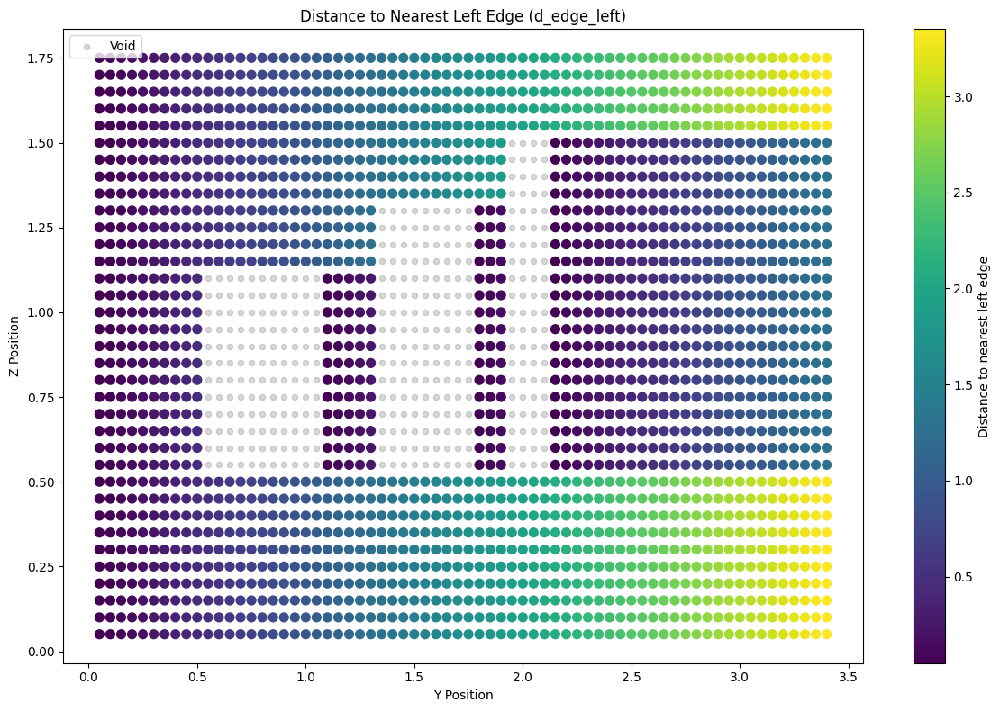

In [8]:
import matplotlib.pyplot as plt

# Calculate d_edge
data = calculate_d_edge_left(data)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_edge values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_edge_left'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest left edge')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Left Edge (d_edge_left)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [9]:
def calculate_d_edge_right(data):
    # First find global boundaries
    y_min = data['Y_Start'].min()  # should be 0.05
    y_max = data['Y_Start'].max()  # should be 3.35
    z_min = data['Z'].min()        # should be 0.1
    z_max = data['Z'].max()        # should be 1.75

    # Define cavity edges (y coordinates for each cavity)
    cavity_edges = [
        # Cavity 1
        [(0.55, 1.05), (0.55, 1.10)],  # (y_min, z_max)
        # Cavity 2
        [(1.35, 1.75), (0.55, 1.30)],
        # Cavity 3
        [(1.95, 2.10), (0.55, 1.50)]
    ]

    # Initialize d_edge column
    data['d_edge_right'] = 0.0

    # Calculate d_edge for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']
        
        # Initialize distances list with distances to global boundaries
        distances = [
            abs(y - y_max)   # distance to right boundary
        ]       
        # Check each cavity
        for (y_min_cav, y_max_cav), (z_min_cav, z_max_cav) in cavity_edges:
            # Only consider cavity edges if we're at the right z level
            if z_min_cav <= z <= z_max_cav:
                # Add distances to cavity edges if we're not past that cavity
                if y < y_min_cav:
                    distances.append(abs(y - y_min_cav))
        
        # Get minimum distance, but ensure it's at least 0.05
        d_edge = max(min(distances), 0.05)
        data.at[idx, 'd_edge_right'] = d_edge

    return data


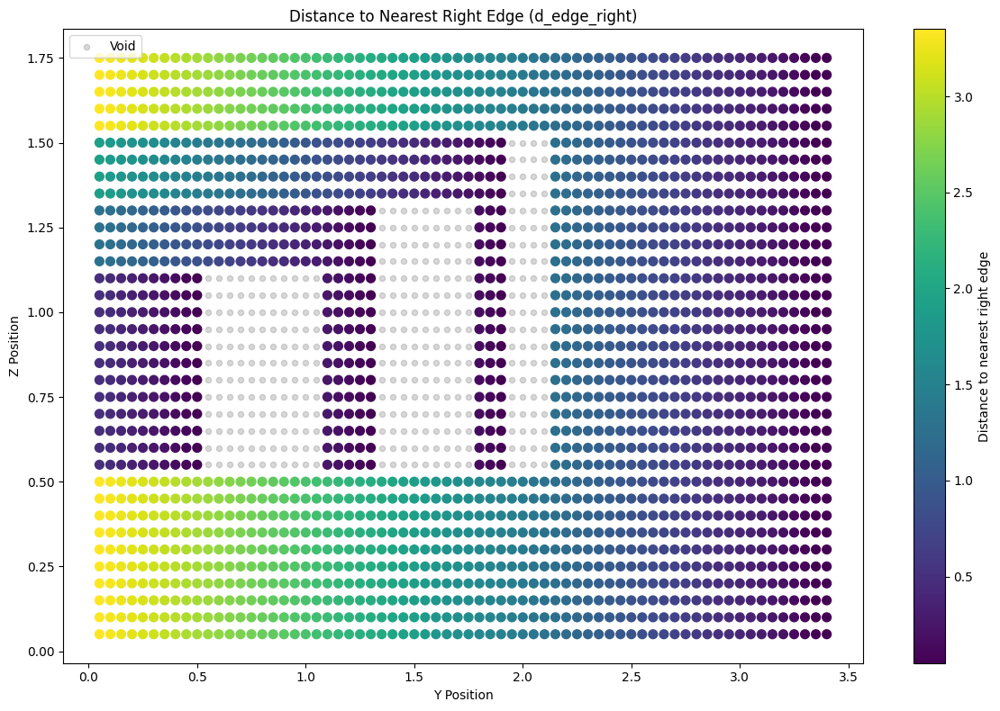

In [10]:
import matplotlib.pyplot as plt

# Calculate d_edge
data = calculate_d_edge_right(data)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_edge values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_edge_right'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest right edge')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Right Edge (d_edge_right)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [11]:
#scanning away from an adiabatic boundary is less important than scanning towards it.
# d_edge_left 
# d_edge_right 

In [12]:
def calculate_d_over_left(data):
    default_value = max(data['Y_Start']) - min(data['Y_Start'])
    overhang_values = data[data['Overhang'] > 0]['Overhang'].unique()

    # Create dictionary of overhang regions
    overhang_regions = {}
    for i in overhang_values:
        ys = data['Y_Start'][data['Overhang'] == i]
        zs = data['Z'][data['Overhang'] == i]
        overhang_regions[i] = {
            'y_min': ys.min(),
            'y_max': ys.max(),
            'z_start': zs.min(),
            'z_end': data['Z'].max()
        }

    # Calculate d_over for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']

        # check which overhang region can be influential
        infl_overs = []
        for index, reg in overhang_regions.items():
            if z >= reg['z_start'] and y > reg['y_max']:
                infl_overs.append(index)

        # First check if point is in any overhang region
        in_overhang = False
        for index in overhang_regions:
            if (y >= overhang_regions[index]['y_min'] and 
                y <= overhang_regions[index]['y_max'] and 
                z >= overhang_regions[index]['z_start']):
                in_overhang = True
                break

        if in_overhang:
            d_over = 0
        else:
            # calculate distances to overhang edges
            distances = []
            for index in infl_overs:
                distances.append(abs(y-overhang_regions[index]['y_max']))

            if distances:
                d_over = max(min(distances), 0.05)
            else:
                d_over = default_value

        data.at[idx, 'd_over_left'] = d_over
    
    return data

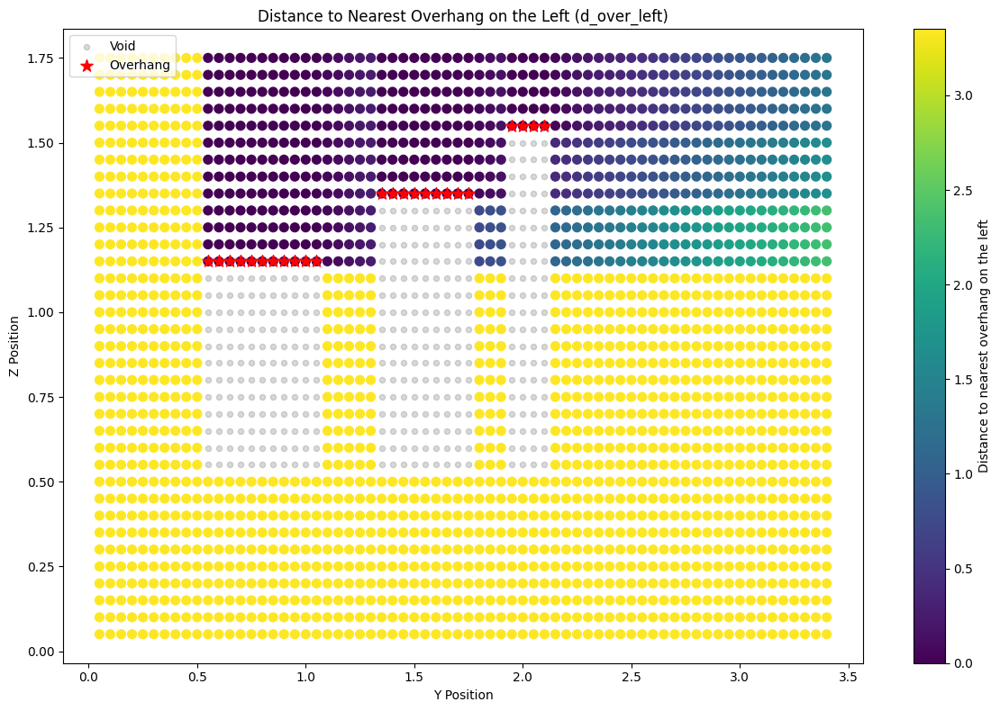

In [13]:
# Calculate d_over_left
data = calculate_d_over_left(data)

# Visualize the results
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_over values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_over_left'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add markers for overhang regions
overhang_mask = data['Overhang'] > 0
ax.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
          marker='*', s=100, c='red', label='Overhang')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest overhang on the left')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Overhang on the Left (d_over_left)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [14]:
def calculate_d_over_right(data):
    default_value = max(data['Y_Start']) - min(data['Y_Start'])
    overhang_values = data[data['Overhang'] > 0]['Overhang'].unique()

    # Create dictionary of overhang regions
    overhang_regions = {}
    for i in overhang_values:
        ys = data['Y_Start'][data['Overhang'] == i]
        zs = data['Z'][data['Overhang'] == i]
        overhang_regions[i] = {
            'y_min': ys.min(),
            'y_max': ys.max(),
            'z_start': zs.min(),
            'z_end': data['Z'].max()
        }

    # Calculate d_over for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']

        # check which overhang region can be influential
        infl_overs = []
        for index, reg in overhang_regions.items():
            if z >= reg['z_start'] and y < reg['y_min']:
                infl_overs.append(index)

        # First check if point is in any overhang region
        in_overhang = False
        for index in overhang_regions:
            if (y >= overhang_regions[index]['y_min'] and 
                y <= overhang_regions[index]['y_max'] and 
                z >= overhang_regions[index]['z_start']):
                in_overhang = True
                break

        if in_overhang:
            d_over = 0
        else:
            # calculate distances to overhang edges
            distances = []
            for index in infl_overs:
                distances.append(abs(y-overhang_regions[index]['y_min']))

            if distances:
                d_over = max(min(distances), 0.05)
            else:
                d_over = default_value

        data.at[idx, 'd_over_right'] = d_over
    
    return data

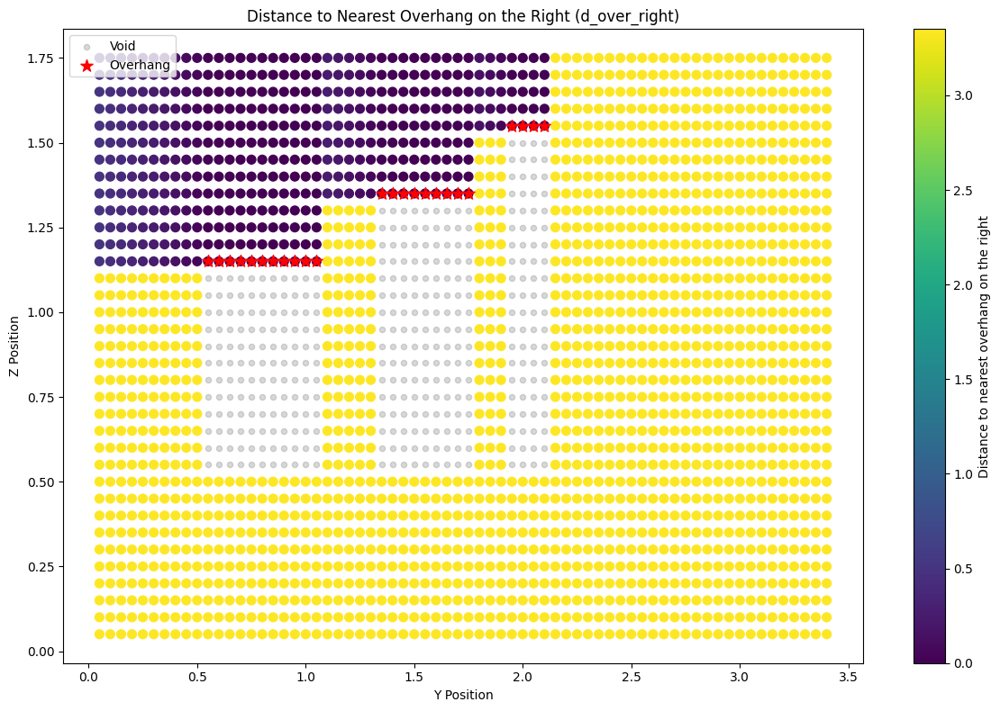

In [15]:
# Calculate d_over_right
data = calculate_d_over_right(data)

# Visualize the results
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_over values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_over_right'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add markers for overhang regions
overhang_mask = data['Overhang'] > 0
ax.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
          marker='*', s=100, c='red', label='Overhang')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest overhang on the right')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Overhang on the Right (d_over_right)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

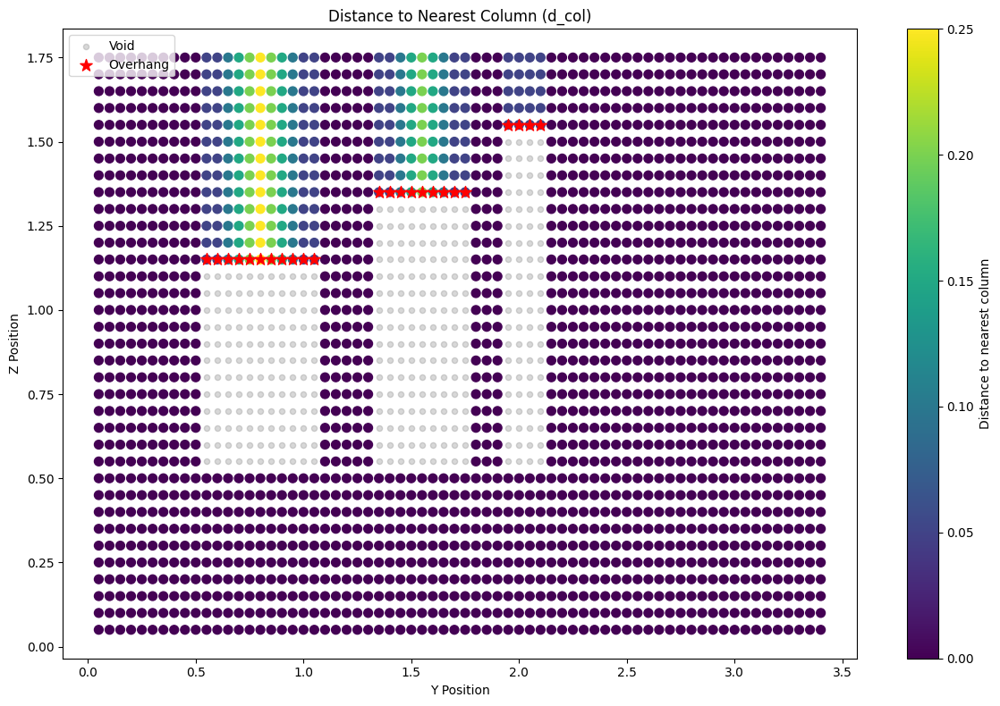

In [16]:
def calculate_d_col(data):
    overhang_values = data[data['Overhang'] > 0]['Overhang'].unique()

    # Create dictionary of overhang regions
    overhang_regions = {}
    for i in overhang_values:
        ys = data['Y_Start'][data['Overhang'] == i]
        zs = data['Z'][data['Overhang'] == i]
        overhang_regions[i] = {
            'y_min': ys.min(),
            'y_max': ys.max(),
            'z_start': zs.min(),
            'z_end': data['Z'].max()
        }

    # Calculate d_col for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']

        # Default is 0
        d_col = 0

        # Check if point is in any overhang region
        for index, reg in overhang_regions.items():
            if (z >= reg['z_start'] and 
                y >= reg['y_min'] and y <= reg['y_max']):
                # Calculate distance to nearest edge of overhang
                d_col = min(abs(y - reg['y_min']), abs(y - reg['y_max']))
                d_col = max(d_col, 0.05)  # Ensure minimum distance is 0.05
                break

        data.at[idx, 'd_col'] = d_col
    
    return data

# Calculate d_col
data = calculate_d_col(data)

# Visualize the results
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_col values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_col'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add markers for overhang regions
overhang_mask = data['Overhang'] > 0
ax.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
          marker='*', s=100, c='red', label='Overhang')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest column')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Column (d_col)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

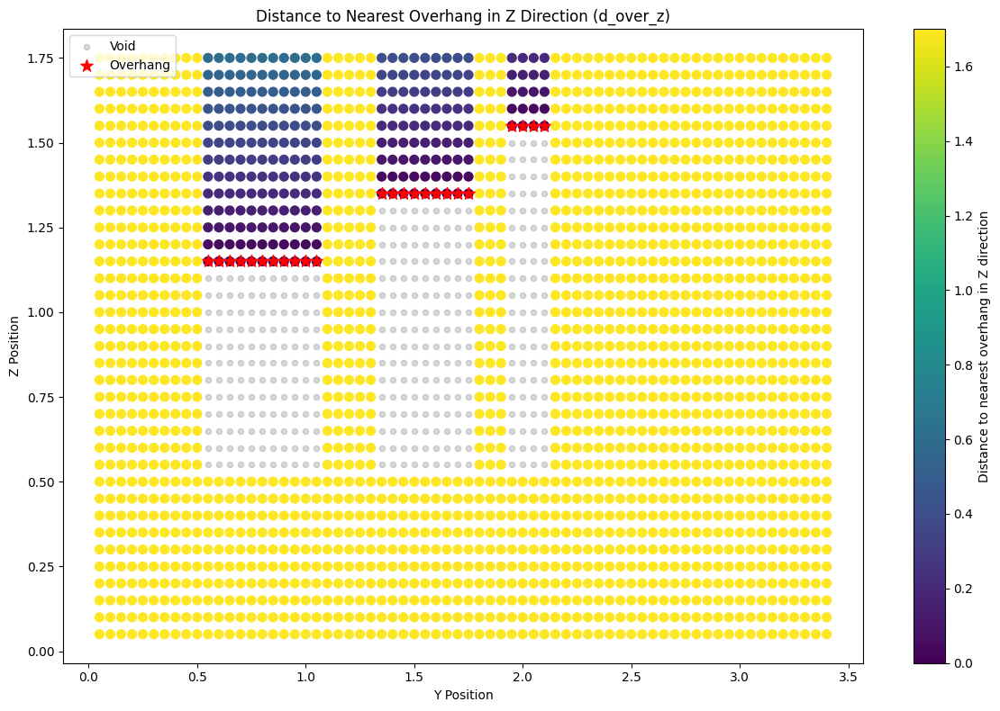

In [17]:
def calculate_d_over_z(data):
    default_value = max(data['Z']) - min(data['Z'])
    overhang_values = data[data['Overhang'] > 0]['Overhang'].unique()

    # Create dictionary of overhang regions
    overhang_regions = {}
    for i in overhang_values:
        ys = data['Y_Start'][data['Overhang'] == i]
        zs = data['Z'][data['Overhang'] == i]
        overhang_regions[i] = {
            'y_min': ys.min(),
            'y_max': ys.max(),
            'z_over': zs.min()  # z position of the overhang
        }

    # Calculate d_over_z for each point
    for idx, row in data.iterrows():
        y = row['Y_Start']
        z = row['Z']

        # Default to high value
        d_over_z = default_value

        # Check if point is in any overhang region (in y)
        for index, reg in overhang_regions.items():
            if (y >= reg['y_min'] and y <= reg['y_max'] and z >= reg['z_over']):
                # Calculate vertical distance
                d_over_z = abs(z - reg['z_over'])
                break

        data.at[idx, 'd_over_z'] = d_over_z
    
    return data

# Calculate d_over_z
data = calculate_d_over_z(data)

# Visualize the results
fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot with d_over_z values
scatter = ax.scatter(data['Y_Start'], data['Z'], c=data['d_over_z'], 
                    cmap='viridis', s=50)

# Add void points for reference
# Cavity 1
y_void1 = np.arange(0.55, 1.1, 0.05)
z_void1 = np.arange(0.55, 1.15, 0.05)
Y_void1, Z_void1 = np.meshgrid(y_void1, z_void1)
void_points1 = np.column_stack((Y_void1.ravel(), Z_void1.ravel()))

# Cavity 2
y_void2 = np.arange(1.35, 1.8, 0.05)
z_void2 = np.arange(0.55, 1.35, 0.05)
Y_void2, Z_void2 = np.meshgrid(y_void2, z_void2)
void_points2 = np.column_stack((Y_void2.ravel(), Z_void2.ravel()))

# Cavity 3
y_void3 = np.arange(1.95, 2.15, 0.05)
z_void3 = np.arange(0.55, 1.55, 0.05)
Y_void3, Z_void3 = np.meshgrid(y_void3, z_void3)
void_points3 = np.column_stack((Y_void3.ravel(), Z_void3.ravel()))

# Combine all void points
void_points = np.vstack((void_points1, void_points2, void_points3))

# Add void points
ax.scatter(void_points[:,0], void_points[:,1], c='gray', s=20, alpha=0.3, label='Void')

# Add markers for overhang regions
overhang_mask = data['Overhang'] > 0
ax.scatter(data[overhang_mask]['Y_Start'], data[overhang_mask]['Z'], 
          marker='*', s=100, c='red', label='Overhang')

# Add colorbar
plt.colorbar(scatter, label='Distance to nearest overhang in Z direction')

# Labels and title
ax.set_xlabel('Y Position')
ax.set_ylabel('Z Position')
ax.set_title('Distance to Nearest Overhang in Z Direction (d_over_z)')
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

In [18]:
data['Wall'] = np.clip(data['Wall'], 0, 1)
data['Overhang'] = np.clip(data['Overhang'], 0, 1)
data['NoLines'] = data['Y_Start']/0.05

In [19]:
def add_previous_features_robust(data):
    """
    Add features from the previous location for each specified metric.
    Previous location is determined by ordering Y_Start within each Z layer.
    If no previous location exists, assigns 0.
    
    Parameters:
    data (pandas.DataFrame): DataFrame containing the original features
    
    Returns:
    pandas.DataFrame: DataFrame with added previous location features
    """
    # List of features to process
    features_to_process = ['Wall', 'Overhang', 'NoLines', 'Power',
    'd_edge_right', 'd_edge_left', 'd_over_left',
    'd_over_right', 'd_col', 'd_over_z']
    
    # Create a copy of the dataframe to avoid modifying the original
    df = data.copy()
    
    # For each feature, create a new column with the previous location's value
    for feature in features_to_process:
        # Create new column name
        prev_feature_name = f'prev_{feature}'
        
        # Initialize the new column with zeros using the same dtype as the original feature
        df[prev_feature_name] = pd.Series(dtype=df[feature].dtype)
        df[prev_feature_name] = df[prev_feature_name].fillna(0)
        
        # Process each Z layer separately
        for z_value in df['Z'].unique():
            # Get data for current Z layer
            z_layer = df[df['Z'] == z_value].copy()
            
            # Sort by Y_Start to determine the sequence
            z_layer = z_layer.sort_values('Y_Start')
            
            # Create a shifted series of the feature values
            shifted_values = z_layer[feature].shift(1)
            
            # Fill NaN values (first position in layer) with 0
            shifted_values = shifted_values.fillna(0)
            
            # Assign the shifted values back to the main dataframe
            df.loc[z_layer.index, prev_feature_name] = shifted_values
    
    return df

# Function to validate the results
def validate_previous_features(data, processed_data):
    """
    Validate that the previous features were correctly assigned.
    
    Parameters:
    data (pandas.DataFrame): Original DataFrame
    processed_data (pandas.DataFrame): DataFrame with added previous features
    """
    print("Validation Report:")
    print("-" * 50)
    
    # Check a few Z layers
    for z_value in sorted(data['Z'].unique())[:3]:  # Check first 3 Z layers
        print(f"\nChecking Z = {z_value}")
        
        # Get data for this Z layer
        z_layer = processed_data[processed_data['Z'] == z_value].sort_values('Y_Start')
        
        # Check a few random positions
        for i in range(min(3, len(z_layer)-1)):  # Check first 3 positions that have a next position
            current_pos = z_layer.iloc[i]
            next_pos = z_layer.iloc[i+1]
            
            print(f"\nPosition {i+1}:")
            print(f"Current Y_Start: {current_pos['Y_Start']}")
            print(f"Next Y_Start: {next_pos['Y_Start']}")
            
            # Check a sample feature
            feature = 'd_edge_right'
            print(f"{feature}: {current_pos[feature]}")
            print(f"prev_{feature} (next position): {next_pos[f'prev_{feature}']}")
            assert current_pos[feature] == next_pos[f'prev_{feature}'], "Mismatch in previous feature assignment"
    
    print("\nValidation completed successfully!")

In [20]:
# Process the data
processed_data = add_previous_features_robust(data)

# Validate the results
validate_previous_features(data, processed_data)

# Example usage
print("\nExample of processed data:")
sample_z = data['Z'].iloc[0]
sample_data = processed_data[processed_data['Z'] == sample_z].sort_values('Y_Start').head()
print("\nFirst few rows for Z =", sample_z)
for feature in ['d_edge_right', 'd_edge_left']:
    print(f"\n{feature} and prev_{feature}:")
    print(sample_data[['Y_Start', feature, f'prev_{feature}']])

Validation Report:
--------------------------------------------------

Checking Z = 0.05

Position 1:
Current Y_Start: 0.05
Next Y_Start: 0.1
d_edge_right: 3.35
prev_d_edge_right (next position): 3.35

Position 2:
Current Y_Start: 0.1
Next Y_Start: 0.15
d_edge_right: 3.3
prev_d_edge_right (next position): 3.3

Position 3:
Current Y_Start: 0.15
Next Y_Start: 0.2
d_edge_right: 3.25
prev_d_edge_right (next position): 3.25

Checking Z = 0.1

Position 1:
Current Y_Start: 0.05
Next Y_Start: 0.1
d_edge_right: 3.35
prev_d_edge_right (next position): 3.35

Position 2:
Current Y_Start: 0.1
Next Y_Start: 0.15
d_edge_right: 3.3
prev_d_edge_right (next position): 3.3

Position 3:
Current Y_Start: 0.15
Next Y_Start: 0.2
d_edge_right: 3.25
prev_d_edge_right (next position): 3.25

Checking Z = 0.15

Position 1:
Current Y_Start: 0.05
Next Y_Start: 0.1
d_edge_right: 3.35
prev_d_edge_right (next position): 3.35

Position 2:
Current Y_Start: 0.1
Next Y_Start: 0.15
d_edge_right: 3.3
prev_d_edge_right (next

In [21]:
processed_data.to_csv('./Data/uniform5.csv', index=False)  


In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression, SelectKBest, f_regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

def analyze_features(data, feature_cols, target_cols):
    """
    Comprehensive feature analysis using multiple methods
    """
    results = {}
    
    # 1. Correlation Analysis
    def correlation_analysis():
        corr_matrix = data[feature_cols + target_cols].corr()
        
        # Create correlation heatmap
        plt.figure(figsize=(12, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
        plt.title('Feature Correlation Matrix')
        plt.tight_layout()
        plt.show()
        
        # Get correlation with targets
        target_corr = corr_matrix[target_cols].loc[feature_cols]
        return target_corr
    
    # 2. Mutual Information Analysis
    def mutual_info_analysis():
        mi_scores = {}
        for target in target_cols:
            mi = mutual_info_regression(data[feature_cols], data[target])
            mi_scores[target] = dict(zip(feature_cols, mi))
        return pd.DataFrame(mi_scores)
    
    # 3. Feature Importance using Random Forest
    def random_forest_importance():
        importances = {}
        for target in target_cols:
            rf = RandomForestRegressor(n_estimators=100, random_state=42)
            rf.fit(data[feature_cols], data[target])
            importances[target] = dict(zip(feature_cols, rf.feature_importances_))
        return pd.DataFrame(importances)
    
    # 4. Forward Feature Selection
    def forward_selection(max_features=5):
        results = {}
        for target in target_cols:
            best_features = []
            best_score = float('-inf')
            remaining_features = feature_cols.copy()
            
            for i in range(max_features):
                feature_scores = {}
                for feature in remaining_features:
                    current_features = best_features + [feature]
                    rf = RandomForestRegressor(n_estimators=100, random_state=42)
                    scores = cross_val_score(
                        rf, 
                        data[current_features], 
                        data[target],
                        cv=5,
                        scoring='r2'
                    )
                    feature_scores[feature] = scores.mean()
                
                best_feature = max(feature_scores.items(), key=lambda x: x[1])
                if best_feature[1] > best_score:
                    best_score = best_feature[1]
                    best_features.append(best_feature[0])
                    remaining_features.remove(best_feature[0])
                else:
                    break
                    
            results[target] = {
                'features': best_features,
                'score': best_score
            }
        return results

    # Run all analyses
    results['correlation'] = correlation_analysis()
    results['mutual_info'] = mutual_info_analysis()
    results['rf_importance'] = random_forest_importance()
    results['forward_selection'] = forward_selection()
    
    # Print summary
    print("\nFeature Selection Summary:")
    print("-" * 50)
    
    for target in target_cols:
        print(f"\nTarget: {target}")
        print("-" * 30)
        
        # Correlation ranking
        corr_ranking = results['correlation'][target].abs().sort_values(ascending=False)
        print("\nTop features by correlation:")
        print(corr_ranking)
        
        # Mutual Information ranking
        mi_ranking = results['mutual_info'][target].sort_values(ascending=False)
        print("\nTop features by mutual information:")
        print(mi_ranking)
        
        # Random Forest importance ranking
        rf_ranking = results['rf_importance'][target].sort_values(ascending=False)
        print("\nTop features by Random Forest importance:")
        print(rf_ranking)
        
        # Forward selection results
        print("\nBest features from forward selection:")
        print(f"Features: {results['forward_selection'][target]['features']}")
        print(f"R² Score: {results['forward_selection'][target]['score']:.4f}")
    
    return results



In [ ]:
# First, let's define our feature columns and target columns
feature_cols = [
    'Z', 'Wall', 'Overhang', 'NoLines', 'Power',
    'd_edge_right', 'd_edge_left', 'd_over_left',
    'd_over_right', 'd_col', 'd_over_z',
    'prev_medianMLength15', 'prev_medianMLength30', 'prev_medianMLength60',
    'prev_meanNumPixels15', 'prev_meanNumPixels30', 'prev_meanNumPixels60',
    'prev_meanLineIntensity'
]

# Define target columns - you can analyze multiple targets at once
target_cols = [
    'medianMLength15',
    'medianMLength30', 
    'medianMLength60',
    'meanNumPixels15',
    'meanNumPixels30',
    'meanNumPixels60',
    'meanLineIntensity'
]

# Run the analysis
results = analyze_features(processed_data, feature_cols, target_cols)



In [ ]:
specific_target = ['medianMLength30']
specific_results = analyze_features(processed_data, feature_cols, specific_target)

# Or analyze a subset of features
subset_features = ['prev_medianMLength30', 'd_edge_right', 'prev_meanLineIntensity', 'Z', 'Power']
subset_results = analyze_features(processed_data, subset_features, target_cols)